In [1]:
%pylab inline
from __future__ import print_function
import os
import time
import IPython

import numpy as np

import librosa

Populating the interactive namespace from numpy and matplotlib


In [2]:
y, sr = librosa.load('gould-wtc1.wav', sr=None)
print(sr, y.shape)

11025 (330750,)


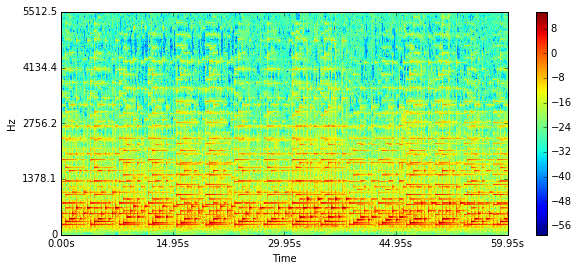

In [24]:
n_fft = 1024
S = librosa.stft(y, n_fft=n_fft)
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.logamplitude(S), sr=sr, x_axis='time', y_axis='linear', cmap='jet')
plt.colorbar()
IPython.display.Audio(y, rate=sr)

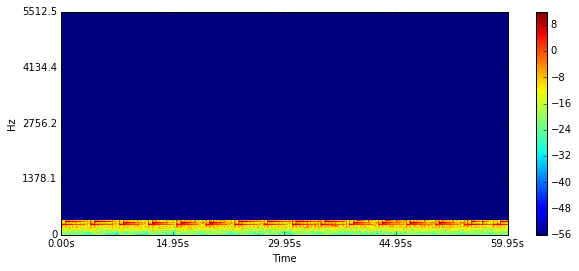

In [25]:
cutoff_bin = int(round(370.0 / sr * n_fft))
S_lpf = S.copy()
S_lpf[cutoff_bin:] = 0
y_lpf = librosa.istft(S_lpf)
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.logamplitude(S_lpf), sr=sr, x_axis='time', y_axis='linear', cmap='jet')
plt.colorbar()
plt.clim([-56, 12])
IPython.display.Audio(y_lpf, rate=sr)

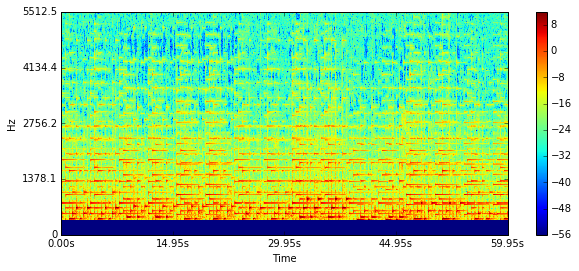

In [26]:
S_hpf = S.copy()
S_hpf[:cutoff_bin] = 0
y_hpf = librosa.istft(S_hpf)
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.logamplitude(S_hpf), sr=sr, x_axis='time', y_axis='linear', cmap='jet')
plt.colorbar()
plt.clim([-56, 12])
IPython.display.Audio(y_hpf, rate=sr)

(513, 40) (40, 1292)


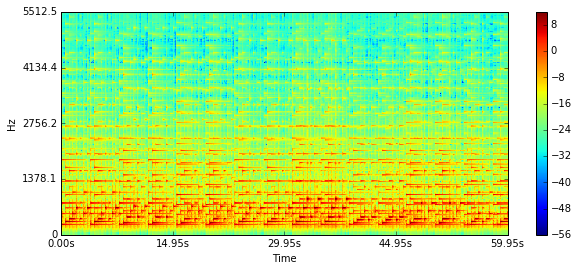

In [36]:
n_components = 40
W, H = librosa.decompose.decompose(np.abs(S), n_components=n_components, sort=True)
print(W.shape, H.shape)
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.logamplitude(np.dot(W, H)), sr=sr, x_axis='time', y_axis='linear', cmap='jet')
plt.colorbar()
plt.clim([-56, 12])


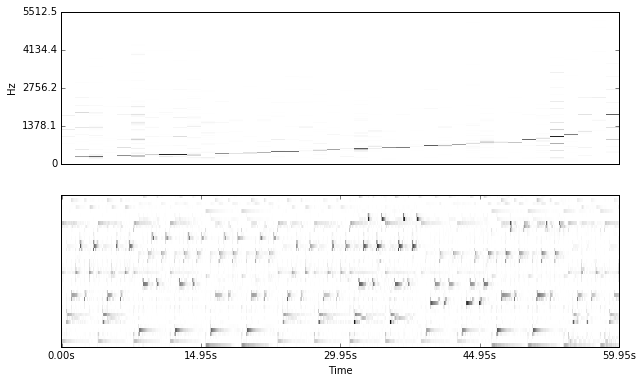

In [35]:
plt.figure(figsize=(10, 6))
plt.subplot(211)
librosa.display.specshow(np.abs(W), sr=sr, x_axis='off', y_axis='linear', cmap='gray_r')
plt.subplot(212)
librosa.display.specshow(np.abs(H), sr=sr, x_axis='time', y_axis='off', cmap='gray_r')

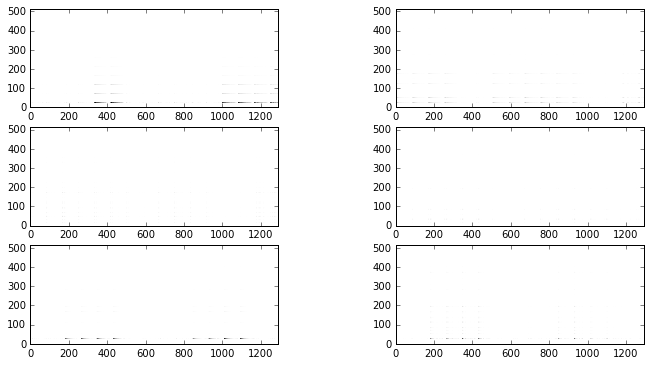

In [38]:
# Calculate masking as proportion of full reconstruction.
masks = np.zeros((n_components, S.shape[0], S.shape[1]))
for n in range(n_components):
    masks[n] = np.dot(W[:,[n]], H[[n]])
total = np.sum(masks, axis=0)
total += (total == 0)
num_to_show = 6
plt.figure(figsize=(12, 6))
for n in range(num_to_show):
    plt.subplot(3, 2, n + 1)
    plt.imshow(masks[n], origin="bottom", interpolation="nearest", cmap="gray_r")
    Y = masks[n] / total * S
    y = librosa.istft(Y)
    IPython.display.display( IPython.display.Audio(y, rate=sr) )

In [39]:
components_to_use = np.arange(15)
mask = np.dot(W[:, components_to_use], H[components_to_use])
Y = mask / total * S
y = librosa.istft(Y)
IPython.display.display( IPython.display.Audio(y, rate=sr) )

In [43]:
components_to_use = np.arange(15, 40)
mask = np.dot(W[:, components_to_use], H[components_to_use])
Y = mask / total * S
y = librosa.istft(Y)
IPython.display.display( IPython.display.Audio(y, rate=sr) )